# Imports and cleaning

In [1]:
import pandas as pd
import plotly.express as px
import project_library as pl



c:\Users\alfie\anaconda3\envs\neural\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
pd.set_option("display.max_colwidth", 200)

# ---- Load NRC ----
NRC_PATH = "./input_data/Spanish-NRC-EmoLex.txt"
nrc_lexicon = pl.load_nrc_lexicon(NRC_PATH)

print("Tamaño del lexicón:", len(nrc_lexicon), "palabras")

# Import data

df_2024 = pd.read_csv('./input_data/datos_2024.csv')
df_2025 = pd.read_csv('./input_data/datos_2025.csv')

df_2024.drop(columns='Unnamed: 0', inplace=True)
df_2025.drop(columns='Unnamed: 0', inplace=True)

df_data = pd.concat([df_2024, df_2025], ignore_index=True)
df_data['domain'] = df_data.domain.str.split('.').str[0]

df_clean = pl.fast_clean_dataset(df_data)

print(f"Antes: {len(df_data)}")
print(f"Después: {len(df_clean)}")

df_clean.to_csv('./input_data/datos_clean.csv', index=False)

# Compute emotions

In [2]:
df_clean = pd.read_csv('./input_data/datos_clean.csv')

df_emotional = pl.compute_emotion_features(df_clean, nrc_lexicon)

DOMINIOS_MX = [
        'proceso.com.mx', 'eluniversal.com.mx', 'milenio.com',
        'excelsior.com.mx', 'aristeguinoticias.com', 'elimparcial.com',
        'jornada.com.mx', 'animalpolitico.com', 'eleconomista.com.mx',
        'elfinanciero.com.mx'
    ]

dominios_clean = [i.split('.')[0] for i in DOMINIOS_MX]

print(f'Registros antes de tirar dominios filtrados: {df_emotional.shape[0]}')

df_emotional = df_emotional[df_emotional.domain.isin(dominios_clean)].reset_index(drop=True)

print(f'Registros después de tirar dominios filtrados: {df_emotional.shape[0]}')

df_emotional.to_csv('./input_data/datos_clean_emo.csv', index=False)
df_emotional.head()



Calculando emociones: 100%|██████████| 288959/288959 [00:02<00:00, 98411.89it/s] 


Registros antes de tirar dominios filtrados: 288959
Registros después de tirar dominios filtrados: 283538


,date,title,domain,url,language,source,fetched_art,title_norm,title_clean,e_anger,...,e_disgust,e_fear,e_joy,e_negative,e_positive,e_sadness,e_surprise,e_trust,valence,arousal
0,2024-01-01,Manny Pacquiao anuncia que volverá a pelear contra Floyd Mayweather Jr .,proceso,https://www.proceso.com.mx/deportes/2023/12/31/manny-pacquiao-anuncia-que-volvera-pelear-contra-floyd-mayweather-jr-321300.html,Spanish,gdelt,4,manny pacquiao anuncia que volverá a pelear contra floyd mayweather jr .,manny pacquiao anuncia volverá pelear contra floyd mayweather jr,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2024-01-01,Japón activa alerta por tsunami tras una serie de sismos muy potentes en la costa noroeste,proceso,https://www.proceso.com.mx/internacional/2024/1/1/japon-activa-alerta-por-tsunami-tras-una-serie-de-sismos-muy-potentes-en-la-costa-noroeste-321302.html,Spanish,gdelt,4,japón activa alerta por tsunami tras una serie de sismos muy potentes en la costa noroeste,japón activa alerta tsunami serie sismos potentes costa noroeste,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,2.0,0.0
2,2024-01-01,Rusia lanza cifra récord de drones sobre Ucrania mientras Moscú y Kiev continúan sus ataques aéreos,proceso,https://www.proceso.com.mx/internacional/2024/1/1/rusia-lanza-cifra-record-de-drones-sobre-ucrania-mientras-moscu-kiev-continuan-sus-ataques-aereos-321301.html,Spanish,gdelt,4,rusia lanza cifra récord de drones sobre ucrania mientras moscú y kiev continúan sus ataques aéreos,rusia lanza cifra récord drones ucrania mientras moscú kiev continúan ataques aéreos,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,-2.0,3.0
3,2024-01-01,Putin ve el ataque ucraniano en Bélgorod como acto de terrorismo y promete que no quedará impune,proceso,https://www.proceso.com.mx/internacional/2024/1/1/putin-ve-el-ataque-ucraniano-en-belgorod-como-acto-de-terrorismo-promete-que-no-quedara-impune-321303.html,Spanish,gdelt,4,putin ve el ataque ucraniano en bélgorod como acto de terrorismo y promete que no quedará impune,putin ve ataque ucraniano bélgorod acto terrorismo promete no quedará impune,2.0,...,1.0,2.0,0.0,2.0,0.0,1.0,0.0,0.0,-7.0,5.0
4,2024-01-01,Peso Pluma despide al 2023 con emotivo mensaje a sus fans : gracias por el mejor año de mi vida,eluniversal,https://www.eluniversal.com.mx/espectaculos/peso-pluma-despide-al-2023-con-emotivo-mensaje-a-sus-fans-gracias-por-el-mejor-ano-de-mi-vida/,Spanish,gdelt,30,peso pluma despide al 2023 con emotivo mensaje a sus fans : gracias por el mejor año de mi vida,peso pluma despide emotivo mensaje fans gracias mejor año mi vida,0.0,...,1.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,3.0,5.0


# Balance data

In [3]:
df_emotional = pd.read_csv('./input_data/datos_clean_emo.csv')

# Asegurar formato datetime
df_emotional["date"] = pd.to_datetime(df_emotional["date"])

# Crear columna año-mes
df_emotional["year_month"] = df_emotional["date"].dt.to_period("M").astype(str)


print(df_emotional["domain"].value_counts())



# Contar artículos por dominio y mes
articles_month_source = (
    df_emotional.groupby(["year_month", "domain"])
                .size()
                .reset_index(name="count")
)

# Gráfica
fig = px.bar(
    articles_month_source,
    x="year_month",
    y="count",
    color="domain",
    title="Número de artículos por mes y por fuente",
    labels={"year_month": "Mes", "count": "Número de artículos"},
)

fig.update_layout(
    barmode="stack",   # Cambiar a "group" si quieres barras separadas
    xaxis_tickangle=-45,
    width=1000,
    height=600
)

fig.show()

domain
eluniversal          65044
elimparcial          51615
milenio              44333
elfinanciero         26971
jornada              23191
excelsior            19151
proceso              16955
aristeguinoticias    14074
eleconomista         12794
animalpolitico        9410
Name: count, dtype: int64


In [4]:
df_bal = pl.balancear_fuentes(df_emotional, n_minimo=9400)
print(df_bal["domain"].value_counts())

# Contar artículos por dominio y mes
articles_month_source = (
    df_bal.groupby(["year_month", "domain"])
                .size()
                .reset_index(name="count")
)

# Gráfica
fig = px.bar(
    articles_month_source,
    x="year_month",
    y="count",
    color="domain",
    title="Número de artículos por mes y por fuente",
    labels={"year_month": "Mes", "count": "Número de artículos"},
)

fig.update_layout(
    barmode="stack",   # Cambiar a "group" si quieres barras separadas
    xaxis_tickangle=-45,
    width=1000,
    height=600
)

fig.show()

df_bal.to_csv('./input_data/datos_balanceados.csv', index=False)


domain
animalpolitico       9400
aristeguinoticias    9400
eleconomista         9400
elfinanciero         9400
elimparcial          9400
eluniversal          9400
excelsior            9400
jornada              9400
milenio              9400
proceso              9400
Name: count, dtype: int64


c:\Users\alfie\OneDrive\Documents\Maestría\Tercer_semestre\Introduccion_DS\DS_Proyecto_final\project_library\data_handling.py:203: FutureWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



# ML Models

### PCA

In [4]:
df_bal = pd.read_csv('./input_data/datos_balanceados.csv')
df_pca, pca_model = pl.run_emotion_pca(df_bal)

df_pca.to_csv("./input_data/noticias_emociones_con_pca.csv", index=False)

pl.plot_pca_emotions(df_pca)




Varianza explicada por PC1 y PC2:
[0.3580237  0.28373053]


In [5]:
valence_month_source = (
    df_bal.groupby(["year_month", "domain"])["valence"]
           .mean()
           .reset_index()
)

fig = px.line(
    valence_month_source,
    x="year_month",
    y="valence",
    color="domain",
    title="Valence promedio por mes y por fuente",
    markers=True
)

fig.update_layout(width=1000, height=550, xaxis_tickangle=-45)
fig.show()


In [6]:
arousal_month_source = (
    df_bal.groupby(["year_month", "domain"])["arousal"]
           .mean()
           .reset_index()
)

fig = px.line(
    arousal_month_source,
    x="year_month",
    y="arousal",
    color="domain",
    title="Arousal promedio por mes y por fuente",
    markers=True
)

fig.update_layout(width=1000, height=550, xaxis_tickangle=-45)
fig.show()


In [9]:
EMOTIONS = [
    'anger', 'anticipation', 'disgust', 'fear', 'joy',
    'negative', 'positive', 'sadness', 'surprise', 'trust'
]

emotion_cols = [f"e_{e}" for e in EMOTIONS]

heatmap_month = (
    df_bal.groupby("year_month")[emotion_cols]
           .sum()
           .reset_index()
)

fig = px.imshow(
    heatmap_month.set_index("year_month"),
    aspect="auto",
    labels=dict(x="Emoción", y="Mes", color="Intensidad"),
    title="Heatmap NRC por mes"
)

fig.update_layout(width=1000, height=650)
fig.show()


# Neural Network (LSTM)

In [1]:
import torch
from torch.utils.data import TensorDataset, DataLoader

In [2]:
print(torch.__version__)
print("CUDA:", torch.version.cuda)
print("is_available:", torch.cuda.is_available())
if torch.cuda.is_available():
    print(torch.cuda.get_device_name(0))



2.5.1+cu121
CUDA: 12.1
is_available: True
NVIDIA GeForce RTX 4060 Laptop GPU


In [3]:
from sklearn.model_selection import train_test_split
import project_library as pl
import pandas as pd
from torch.utils.data import TensorDataset, DataLoader

df_bal = pd.read_csv('./input_data/datos_balanceados.csv')
df_train, df_temp = train_test_split(df_bal, test_size=0.2, random_state=42)
df_val, df_test = train_test_split(df_temp, test_size=0.5, random_state=42)

vocab = pl.build_vocab_from_titles(df_train, max_size=15000, min_freq=2)
domain2id = pl.build_domain2id(df_bal)

print("Vocab size:", len(vocab))
print("Total domains:", len(domain2id))

print("\nPreencoding:")
print("   Training set")
Xtr, Ltr, Dtr, Ytr = pl.preencode_dataframe(df_train, vocab, domain2id, max_len=40)
print("   Validation set")
Xval, Lval, Dval, Yval = pl.preencode_dataframe(df_val, vocab, domain2id, max_len=40)
print("   Test set")
Xte, Lte, Dte, Yte = pl.preencode_dataframe(df_test, vocab, domain2id, max_len=40)

print('\nCreating tensors:')
print("   Training set")
train_ds = TensorDataset(Xtr, Ltr, Dtr, Ytr)
print("   Validation set")
val_ds   = TensorDataset(Xval, Lval, Dval, Yval)
print("   Test set")
test_ds  = TensorDataset(Xte, Lte, Dte, Yte)

print('\nCreating dataloaders')
print("   Training set")
train_loader = DataLoader(train_ds, batch_size=64, shuffle=True)
print("   Validation set")
val_loader   = DataLoader(val_ds, batch_size=64)
print("   Test set")
test_loader  = DataLoader(test_ds, batch_size=64)

vocab_size  = len(vocab)
domain_size = len(domain2id)

model = pl.SentimentLSTM(vocab_size, domain_size)

print("\nBegining training")

model.train_model(
    train_loader,
    val_loader,        # ← ahora sí
    epochs=12,
    lr=2e-4,
    wd=1e-5,
    patience=2,
    min_epochs=3
)




c:\Users\alfie\anaconda3\envs\neural\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Vocab size: 15002
Total domains: 10

Preencoding:
   Training set
   Validation set
   Test set

Creating tensors:
   Training set
   Validation set
   Test set

Creating dataloaders
   Training set
   Validation set
   Test set

Begining training
Entrenando en: cuda:0


Epoch 01 | train_loss=0.8614 | train_acc=0.614 | val_loss=0.7039 | val_acc=0.704


Epoch 02 | train_loss=0.6299 | train_acc=0.742 | val_loss=0.5842 | val_acc=0.766


Epoch 03 | train_loss=0.5123 | train_acc=0.798 | val_loss=0.5164 | val_acc=0.796


Epoch 04 | train_loss=0.4338 | train_acc=0.834 | val_loss=0.4742 | val_acc=0.815


Epoch 05 | train_loss=0.3763 | train_acc=0.858 | val_loss=0.4509 | val_acc=0.833


Epoch 06 | train_loss=0.3310 | train_acc=0.878 | val_loss=0.4399 | val_acc=0.840


Epoch 07 | train_loss=0.2947 | train_acc=0.894 | val_loss=0.4457 | val_acc=0.833


Epoch 08 | train_loss=0.2633 | train_acc=0.906 | val_loss=0.3870 | val_acc=0.862


Epoch 09 | train_loss=0.2354 | train_acc=0.917 | val_loss=0.4081 | val_acc=0.863


Epoch 10 | train_loss=0.2079 | train_acc=0.927 | val_loss=0.3660 | val_acc=0.868


Epoch 11 | train_loss=0.1867 | train_acc=0.936 | val_loss=0.3454 | val_acc=0.880


Epoch 12 | train_loss=0.1640 | train_acc=0.944 | val_loss=0.3545 | val_acc=0.881
Entrenamiento completo.


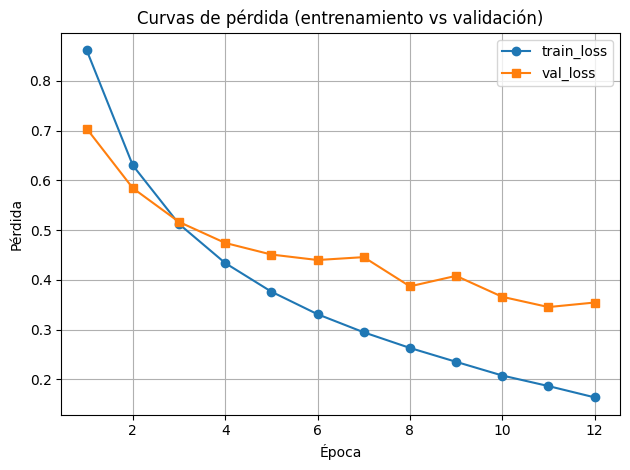

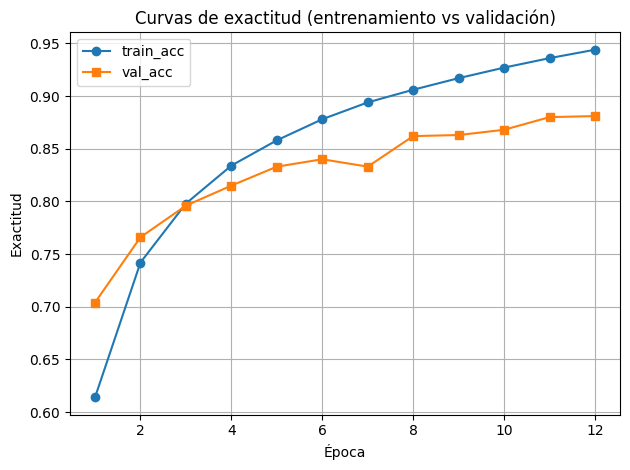

In [1]:
import matplotlib.pyplot as plt

# Datos
epochs    = list(range(1, 13))
train_loss = [0.8614, 0.6299, 0.5123, 0.4338, 0.3763, 0.3310,
              0.2947, 0.2633, 0.2354, 0.2079, 0.1867, 0.1640]
val_loss   = [0.7039, 0.5842, 0.5164, 0.4742, 0.4509, 0.4399,
              0.4457, 0.3870, 0.4081, 0.3660, 0.3454, 0.3545]

train_acc = [0.614, 0.742, 0.798, 0.834, 0.858, 0.878,
             0.894, 0.906, 0.917, 0.927, 0.936, 0.944]
val_acc   = [0.704, 0.766, 0.796, 0.815, 0.833, 0.840,
             0.833, 0.862, 0.863, 0.868, 0.880, 0.881]

# -----------------------
# Curva de pérdida
# -----------------------
plt.figure()
plt.plot(epochs, train_loss, marker="o", label="train_loss")
plt.plot(epochs, val_loss, marker="s", label="val_loss")
plt.xlabel("Época")
plt.ylabel("Pérdida")
plt.title("Curvas de pérdida (entrenamiento vs validación)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curves.png", dpi=300)

# -----------------------
# Curva de exactitud
# -----------------------
plt.figure()
plt.plot(epochs, train_acc, marker="o", label="train_acc")
plt.plot(epochs, val_acc, marker="s", label="val_acc")
plt.xlabel("Época")
plt.ylabel("Exactitud")
plt.title("Curvas de exactitud (entrenamiento vs validación)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("accuracy_curves.png", dpi=300)

plt.show()


In [4]:
import torch

def evaluate(model, loader):
    device = next(model.parameters()).device
    model.eval()
    correct, total = 0, 0
    
    with torch.no_grad():
        for x, l, d, y in loader:
            x = x.to(device)
            l = l.to(device)
            d = d.to(device)
            y = y.to(device)

            logits = model(x, l, d)
            pred = logits.argmax(1)

            correct += (pred == y).sum().item()
            total += y.size(0)

    return correct / total

acc_val = evaluate(model, val_loader)
acc_test = evaluate(model, test_loader)

print("Val accuracy:", acc_val)
print("Test accuracy:", acc_test)



Val accuracy: 0.8808510638297873
Test accuracy: 0.8857446808510638


# Confusion Matrix

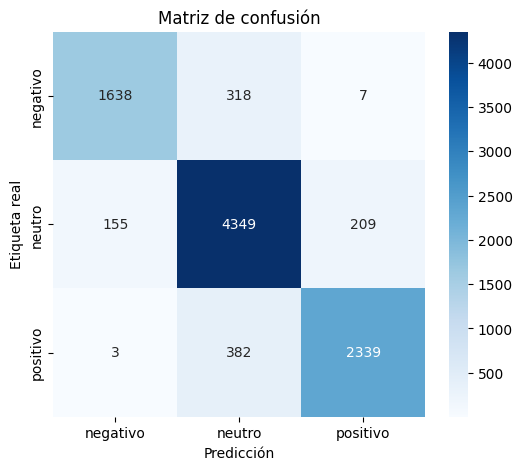

In [5]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def confusion_matrix_model(model, loader):
    device = next(model.parameters()).device
    model.eval()

    all_preds = []
    all_labels = []

    with torch.no_grad():
        for x, l, d, y in loader:
            x = x.to(device)
            l = l.to(device)
            d = d.to(device)
            y = y.to(device)

            logits = model(x, l, d)
            preds = logits.argmax(1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(y.cpu().numpy())

    cm = confusion_matrix(all_labels, all_preds)

    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d',
                xticklabels=["negativo","neutro","positivo"],
                yticklabels=["negativo","neutro","positivo"],
                cmap="Blues")
    plt.xlabel("Predicción")
    plt.ylabel("Etiqueta real")
    plt.title("Matriz de confusión")
    plt.show()

# Ejemplo:
confusion_matrix_model(model, test_loader)


In [6]:
def save_checkpoint(model, vocab, domain2id, path="modelo_lstm.pth"):
    ckpt = {
        "model_state": model.state_dict(),
        "vocab": vocab,
        "domain2id": domain2id
    }
    torch.save(ckpt, path)
    print(f"Modelo guardado en {path}")


In [7]:
save_checkpoint(model, vocab, domain2id, "sentinel_mx_lstm.pth")

Modelo guardado en sentinel_mx_lstm.pth


In [8]:
vocab_inv = {idx: tok for tok, idx in vocab.items()}

In [25]:
def predict_title(title, domain, model, vocab, domain2id, max_len=40):
    device = next(model.parameters()).device

    # --- procesar texto ---
    ids, length = pl.encode(title, vocab, max_len)
    ids = torch.tensor(ids, dtype=torch.long).unsqueeze(0).to(device)
    length = torch.tensor([length], dtype=torch.long).to(device)

    # --- procesar dominio ---
    if domain not in domain2id:
        dom_id = domain2id[next(iter(domain2id))]   # fallback: primer dominio
    else:
        dom_id = domain2id[domain]

    dom_id = torch.tensor([dom_id], dtype=torch.long).to(device)

    # --- forward ---
    model.eval()
    with torch.no_grad():
        logits = model(ids, length, dom_id)
        probs = torch.softmax(logits, dim=1).cpu().numpy()[0]
        pred = probs.argmax()

    label_map = {0: "NEGATIVO", 1: "NEUTRO", 2: "POSITIVO"}

    return {
        "pred": label_map[pred],
        "probs": {
            "negativo": float(probs[0]),
            "neutro": float(probs[1]),
            "positivo": float(probs[2]),
        }
    }


In [26]:
def extract_hidden_states(model, loader):
    model.eval()
    device = next(model.parameters()).device

    hidden_list = []
    label_list = []

    with torch.no_grad():
        for x, lengths, domains, y in loader:
            x = x.to(device)
            lengths = lengths.to(device)
            domains = domains.to(device)

            # forward manual hasta antes de la fc
            emb = model.embedding(x)
            packed = torch.nn.utils.rnn.pack_padded_sequence(
                emb, lengths.cpu(), batch_first=True, enforce_sorted=False
            )
            _, (h_n, _) = model.lstm(packed)

            # concat forward/backward
            h_f = h_n[-2]
            h_b = h_n[-1]
            h = torch.cat([h_f, h_b], dim=1)   # (B, 2H)

            hidden_list.append(h.cpu())
            label_list.append(y)

    return torch.cat(hidden_list), torch.cat(label_list)


In [27]:
hidden_states, labels = extract_hidden_states(model, test_loader)


Varianza explicada por PC1 y PC2:
[0.58637285 0.31532985]


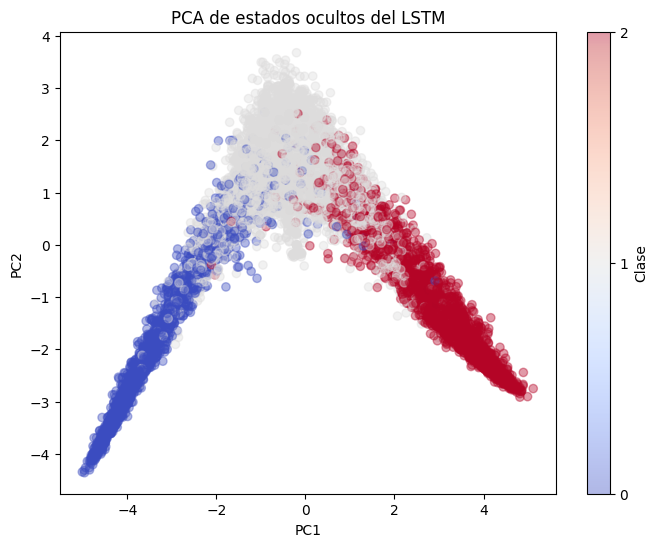

In [28]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

def plot_lstm_pca(hidden_states, labels):
    pca = PCA(n_components=2)
    
    z = pca.fit_transform(hidden_states.numpy())
    print("\nVarianza explicada por PC1 y PC2:")
    print(pca.explained_variance_ratio_)

    plt.figure(figsize=(8,6))
    scatter = plt.scatter(z[:, 0], z[:, 1], c=labels, cmap="coolwarm", alpha=0.4)
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.title("PCA de estados ocultos del LSTM")
    plt.colorbar(scatter, ticks=[0,1,2], label="Clase")
    plt.show()

plot_lstm_pca(hidden_states, labels)


In [29]:
def sample_errors(model, loader, vocab_inv, max_examples=3):
    model.eval()
    device = next(model.parameters()).device

    errors = {("neg","pos"):[], ("pos","neg"):[], ("any","neu"):[]}

    with torch.no_grad():
        for x, lengths, domains, y in loader:
            x = x.to(device)
            lengths = lengths.to(device)
            domains = domains.to(device)
            y = y

            logits = model(x, lengths, domains)
            preds = logits.argmax(1).cpu()

            for i in range(len(y)):
                true = y[i].item()
                pred = preds[i].item()

                # reconstruir texto
                toks = [vocab_inv[t.item()] for t in x[i] if t.item() != 0]

                if true == 0 and pred == 2:
                    errors[("neg","pos")].append(" ".join(toks))
                if true == 2 and pred == 0:
                    errors[("pos","neg")].append(" ".join(toks))
                if pred == 1 and true != 1:
                    errors[("any","neu")].append(" ".join(toks))

                if all(len(v) >= max_examples for v in errors.values()):
                    return errors

    return errors


In [ ]:
errors = sample_errors(model, test_loader, vocab_inv, max_examples=5)
errors
# debía ser contra lo que predijo


{('neg',
  'pos'): ['mp tiene facultades para devolver inmuebles sin invadir funciones del poder judicial', '<UNK> <UNK> de almas el <UNK> toca tu puerta', 'sube a cifra de muertos por fentanilo contaminado en argentina milei acusa al <UNK> de <UNK> al principal responsable', 'vemos clara desesperación en el prian al acusar elección de estado gabriela cuevas', 'no puedo contra toda esta crueldad e injusticia exigen justicia por desaparición de defensores de dh en michoacán', '<UNK> del <UNK> preocupa en reforma a ley de infonavit', 'con la t periodistas se enfrentan al uso <UNK> del poder'],
 ('pos',
  'neg'): ['estos dos signos <UNK> son los menos <UNK> del zodiaco dice un <UNK>', 'vacuna contra el cáncer rusia comienza el desarrollo de este ambicioso proyecto médico', 'hay que reconocer la grandeza de un escritor sheinbaum reconoce legado de vargas llosa tras su fallecimiento'],
 ('any',
  'neu'): ['durazo agradece visita en sonora del presidente lópez obrador y sheinbaum', 'tania ra

In [31]:
res = predict_title(
    "Paz en Irán",
    "milenio.com",
    model,
    vocab,
    domain2id
)

print(res)

{'pred': 'POSITIVO', 'probs': {'negativo': 0.00023251300444826484, 'neutro': 0.05790688470005989, 'positivo': 0.9418606162071228}}


In [33]:
import torch
import pandas as pd


DOMINIOS_MX = [
        'proceso.com.mx', 'eluniversal.com.mx', 'milenio.com',
        'excelsior.com.mx', 'aristeguinoticias.com', 'elimparcial.com',
        'jornada.com.mx', 'animalpolitico.com', 'eleconomista.com.mx',
        'elfinanciero.com.mx'
    ]

domain_list = [i.split('.')[0] for i in DOMINIOS_MX]
# Extraer los embeddings aprendidos por dominio
D = model.domain_emb.weight.detach().cpu()    # (num_domains, domain_embed_dim)

# Pesos de la capa lineal que multiplican ese embedding
W_d = model.fc.weight[:, -model.domain_emb.embedding_dim:].detach().cpu()  # (num_classes, domain_embed_dim)

# Producto = beta_i para cada medio
beta = torch.matmul(W_d, D.T).T   # (num_domains, num_classes)

df_beta = pd.DataFrame(beta.numpy(), columns=["beta_neg", "beta_neu", "beta_pos"])
df_beta["domain"] = domain_list
df_beta = df_beta.set_index("domain")

df_beta


,beta_neg,beta_neu,beta_pos
domain,,,
proceso,-0.243560,0.537297,-0.257726
eluniversal,-0.182992,0.600318,-0.347054
milenio,-0.389773,0.402519,-0.170581
excelsior,-0.059554,0.317311,-0.338398
aristeguinoticias,-0.242886,0.362941,-0.343608
elimparcial,-0.328763,0.386164,-0.290433
jornada,0.034312,0.571069,-0.257351
animalpolitico,-0.071869,0.316081,-0.093319
eleconomista,-0.379035,0.434284,-0.391714


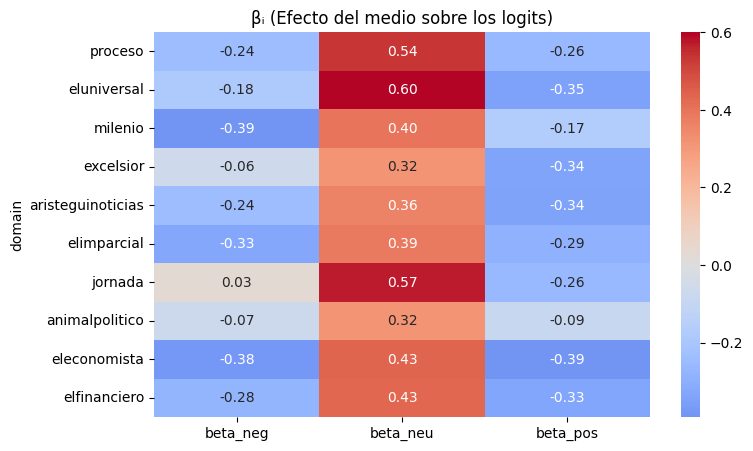

In [34]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
sns.heatmap(df_beta, annot=True, fmt=".2f", cmap="coolwarm", center=0)
plt.title("βᵢ (Efecto del medio sobre los logits)")
plt.show()

In [16]:
df_beta

NameError: name 'df_beta' is not defined